# Identifying Entities in Healthcare Data

## Contents:

- [Workspace set up: Import and Install useful packages](#Importing_required_packages)<br>

- [Data Preprocessing](#Data_Preprocessing)<br>
    - [Construct the proper sentences from individual words and print the 5 sentences.](#Construct)<br>
    - [Count the number of sentences in the processed train and test dataset](#Count_sentences)<br>
    - [Count the number of lines of labels in the processed train and test dataset](#Count_lines)<br>
    
- [Concept Identification](#Concept_Identification)<br>
    - [Extract those tokens which have NOUN or PROPN as their PoS tag and find their frequency](#extract_tokens)<br>
    - [Print the top 25 most common tokens with NOUN or PROPN PoS tags](#print_top_25)<br>
    
- [Defining features for CRF](#Defining_features_for_CRF)<br>

- [Getting the features](#Getting_the_features)<br>
    - [Write a code/function to get the features for a sentence](#code_for_sentence_features)<br>
    - [Write a code/function to get the labels of a sentence](#code_for_sentence_labels)<br>
        
- [Define input and target variables](#Define_input_and_target_variables)<br>
    -[Define the features' values for each sentence as input variable  for CRF model in test and the train dataset ](#Define_features_values)<br>
    - [Define the labels as the target variable for test and the train dataset](#Define_the_labels_as_the_target_variable_for_test_and_the_train_dataset)<br>

- [Build the CRF Model](#Build_the_CRF_Model)<br>

- [Evaluation](#Evaluation)<br>
    -[Predict the labels of each of the tokens in each sentence of the test dataset that has been pre processed earlier](#Predict_test_data_labels)<br>
    - [Calculate the f1 score using the actual labels and the predicted labels of the test dataset](#f1_score)<br>

- [Identifying Diseases and Treatments using Custom NER](#Identifying_Diseases_and_Treatments_using_Custom_NER)<br>
    - [Create the logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset](#Get_predicted_treatments_labels)<br>
    - [Predict the treatment for the disease name: 'hereditary retinoblastoma'](#predict_treatment)<br>

<a id="Importing_required_packages"></a>
## Workspace set up: Import and Install useful packages

In [34]:
!pip install pycrf
!pip install sklearn-crfsuite
!python -m spacy download en

import spacy
import sklearn_crfsuite
from IPython.display import display,HTML
from sklearn_crfsuite import metrics
import spacy.cli
spacy.cli.download("en_core_web_sm")

model = spacy.load("en_core_web_sm")

⚠ As of spaCy v3.0, shortcuts like 'en' are deprecated. Please use the
full pipeline package name 'en_core_web_sm' instead.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 90.7 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


<a id="Data_Preprocessing"></a>
## Data Preprocessing
The dataset provided is in the form of one word per line. Let's understand the format of data below:
- Suppose there are *x* words in a sentence, then there will be *x* continuous lines with one word in each line. 
- Further, the two sentences are separated by empty lines. The labels for the data follow the same format.

**We need to pre-process the data to recover the complete sentences and their labels.**


<a id="Construct"></a>
### Construct the proper sentences from individual words and print the 5 sentences.

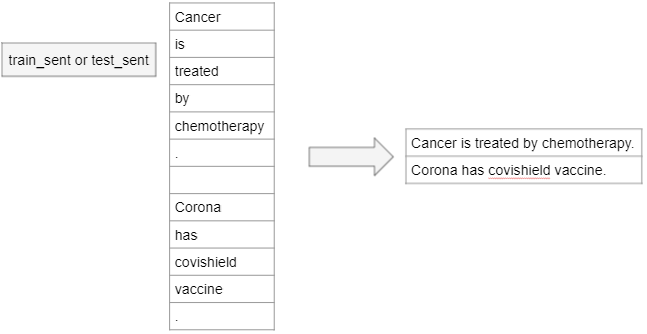

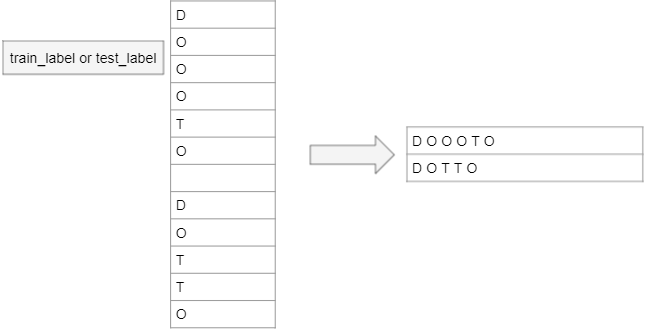

In [35]:
import pandas as pd

# Create a function to process the file and return a sentence list
def preprocess_inputfile(input_file):
    i_file = open(input_file, 'r')
    file_name = i_file.readlines()
    i_file.close()

    output_list = []

    full_sentence = ""

    for each_word in file_name:
        each_word = each_word.strip()
        if each_word == "":
            output_list.append(full_sentence) # To append the complete sentence to the output list
            full_sentence = "" # For new sentence start
        else:
            if full_sentence:
                full_sentence += " " + each_word
            else:
                full_sentence = each_word
                
    return output_list

In [36]:
!wget https://raw.githubusercontent.com/aqwertyuiop48/upgrad_programming/refs/heads/main/2_Course_continuation/_3_NLP/_3_Syntactic_processing_assignment/assignment_data/test_sent -O test_sent
!wget https://raw.githubusercontent.com/aqwertyuiop48/upgrad_programming/refs/heads/main/2_Course_continuation/_3_NLP/_3_Syntactic_processing_assignment/assignment_data/test_label -O test_label
!wget https://raw.githubusercontent.com/aqwertyuiop48/upgrad_programming/refs/heads/main/2_Course_continuation/_3_NLP/_3_Syntactic_processing_assignment/assignment_data/train_sent -O train_sent
!wget https://raw.githubusercontent.com/aqwertyuiop48/upgrad_programming/refs/heads/main/2_Course_continuation/_3_NLP/_3_Syntactic_processing_assignment/assignment_data/train_label -O train_label

test_sentences = preprocess_inputfile('test_sent')
test_labels = preprocess_inputfile('test_label')
train_sentences = preprocess_inputfile('train_sent')
train_labels = preprocess_inputfile('train_label')

--2026-02-26 09:22:34--  https://raw.githubusercontent.com/aqwertyuiop48/upgrad_programming/refs/heads/main/2_Course_continuation/_3_NLP/_3_Syntactic_processing_assignment/assignment_data/test_sent
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 121020 (118K) [text/plain]
Saving to: ‘test_sent’

test_sent           100%[===================>] 118.18K  --.-KB/s    in 0.02s   

2026-02-26 09:22:34 (5.38 MB/s) - ‘test_sent’ saved [121020/121020]

--2026-02-26 09:22:34--  https://raw.githubusercontent.com/aqwertyuiop48/upgrad_programming/refs/heads/main/2_Course_continuation/_3_NLP/_3_Syntactic_processing_assignment/assignment_data/test_label
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...


In [37]:
# Print first five sentences from the processed dataset
for each_item in range(5):
    display(f"Sentence {each_item+1} is: {train_sentences[each_item]}")
    display(f"Label {each_item+1} is: {train_labels[each_item]}")
    display("*"*100)

'Sentence 1 is: All live births > or = 23 weeks at the University of Vermont in 1995 ( n = 2395 ) were retrospectively analyzed for delivery route , indication for cesarean , gestational age , parity , and practice group ( to reflect risk status )'

'Label 1 is: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O'

'****************************************************************************************************'

'Sentence 2 is: The total cesarean rate was 14.4 % ( 344 of 2395 ) , and the primary rate was 11.4 % ( 244 of 2144 )'

'Label 2 is: O O O O O O O O O O O O O O O O O O O O O O O O O'

'****************************************************************************************************'

'Sentence 3 is: Abnormal presentation was the most common indication ( 25.6 % , 88 of 344 )'

'Label 3 is: O O O O O O O O O O O O O O O'

'****************************************************************************************************'

"Sentence 4 is: The `` corrected '' cesarean rate ( maternal-fetal medicine and transported patients excluded ) was 12.4 % ( 273 of 2194 ) , and the `` corrected '' primary rate was 9.6 % ( 190 of 1975 )"

'Label 4 is: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O'

'****************************************************************************************************'

"Sentence 5 is: Arrest of dilation was the most common indication in both `` corrected '' subgroups ( 23.4 and 24.6 % , respectively )"

'Label 5 is: O O O O O O O O O O O O O O O O O O O O O O'

'****************************************************************************************************'

<a id="Count_sentences"></a>
### Count the number of sentences in the processed train and test dataset 

In [38]:
display(f"Number of sentences in processed train dataset is: {len(train_sentences)}")
display(f"Number of sentences in processed test dataset is: {len(test_sentences)}")

'Number of sentences in processed train dataset is: 2599'

'Number of sentences in processed test dataset is: 1056'

<a id="Count_lines"></a>
### Count the number of lines of labels in the processed train and test dataset.

In [39]:
display(f"Number of lines of labels in processed train dataset is: {len(train_labels)}")
display(f"Number of lines of labels in processed test dataset is: {len(test_labels)}")

'Number of lines of labels in processed train dataset is: 2599'

'Number of lines of labels in processed test dataset is: 1056'

<a id="Concept_Identification"></a>
## Concept Identification

We will first explore what are the various concepts present in the dataset. For this, we will use PoS Tagging. 

We will identify all the words from the corpus that have a tag of NOUN or PROPN (nouns) and prepare a dictionary of their counts. We will then output the top 25 most frequently discussed concepts in the entire corpus.

The key thing to check is that we are using both test and train sentences. Note that this is okay because we are using a pre-trained model and applying directly on our data. This is an exploratory analysis on the complete data. Since we are not training anything, there is no point is discarding information in test data

<a id="extract_tokens"></a>
### Extract those tokens which have NOUN or PROPN as their PoS tag and find their frequency

In [40]:
# Creating a list to hold all the tokens which are either NOUN or PROPER NOUN
noun_propn_tokens_list = []

In [41]:
# Each token which is a NOUN or PROPN will be appended to the list "noun_propn_tokens_list"
for sentences in (train_sentences, test_sentences):
    for sent in sentences:
        processed_sent = model(sent)
        for each_token in processed_sent:
            if each_token.pos_ == "NOUN" or each_token.pos_ == "PROPN":
                noun_propn_tokens_list.append(each_token.text)

In [42]:
# Creating a Series to hold the tokens which are either NOUN or PROPER NOUN
df_noun_propn = pd.Series(noun_propn_tokens_list)

<a id="print_top_25"></a>
### Print the top 25 most common tokens with NOUN or PROPN PoS tags

In [43]:
display(
    # Getting then count of each token and sorting the data in top 25 most token counts
df_noun_propn.value_counts().sort_values(ascending=False).head(25)
)

,count
patients,492
treatment,281
%,247
cancer,200
therapy,175
study,153
disease,141
cell,140
lung,116
group,94


<a id="Defining_features_for_CRF"></a>
## Defining features for CRF

We will train a custom CRF to identify diseases (D) and treatments (T) from the data. For this, we will use the training data to train the model and evaluate it on the test set.

Things to check:

- All features needs to be correctly defined
- Only the previous word should be used in addition to the current word for evaluating additional features
- BEG and END words have been correctly marked
- POS tags (pos_tags) have been correctly passed to the method and used

In [44]:
# Let's define the features to get the feature value for one word.

def getFeaturesForOneWord(sentence, pos, pos_tags):
    word = sentence[pos]
    
    features = [
    'word.lower=' + word.lower(), # serves as word id
    'word[-3:]=' + word[-3:],     # last three characters
    'word[-2:]=' + word[-2:],     # last two characters
    'word.isupper=%s' % word.isupper(),  # is the word in all uppercase
    'word.isdigit=%s' % word.isdigit(),  # is the word a number
    'word.startsWithCapital=%s' % word[0].isupper(), # is the word starting with a capital letter
    'word.pos=' + pos_tags[pos]
    ]
    
    #Use the previous word also while defining features
    if(pos > 0):
        prev_word = sentence[pos-1]
        features.extend([
        'prev_word.lower=' + prev_word.lower(), 
        'prev_word.isupper=%s' % prev_word.isupper(),
        'prev_word.isdigit=%s' % prev_word.isdigit(),
        'prev_word.startsWithCapital=%s' % prev_word[0].isupper(),
        'prev_word.pos=' + pos_tags[pos-1]
        ])
    
    # Mark the begining and the end words of a sentence correctly in the form of features.
    else:
        features.append('BEG') # feature to track begin of sentence 

    if(pos == len(sentence)-1):
        features.append('END') # feature to track end of sentence

    return features

<a id="Getting_the_features"></a>
## Getting the features

<a id="code_for_sentence_features"></a>
### Write a code/function to get the features for a sentence

In [45]:
# Function to get features for a sentence.
def getFeaturesForOneSentence(sentence):
    
    # We need to get the pos_tags to be passed to the function
    processed_sent = model(sentence)
    postags = []
    
    for each_token in processed_sent:
        postags.append(each_token.pos_)
    
    sentence_list = sentence.split()
    return [getFeaturesForOneWord(sentence_list, pos, postags) for pos in range(len(sentence_list))]


<a id="code_for_sentence_labels"></a>
### Write a code/function to get the labels of a sentence

In [46]:
# Function to get the labels for a sentence.
def getLabelsInListForOneSentence(labels):
    display(labels.split())
    return labels.split()

<a id="Define_input_and_target_variables"></a>
## Define input and target variables

Correctly computing X and Y sequence matrices for training and test data.
Check that both sentences and labels are processed

<a id="Define_features_values"></a>
### Define the features' values for each sentence as input variable  for CRF model in test and the train dataset 

In [47]:
X_train = [getFeaturesForOneSentence(sentence) for sentence in train_sentences]
X_test = [getFeaturesForOneSentence(sentence) for sentence in test_sentences]

display(
    X_train
)

[[['word.lower=all',
   'word[-3:]=All',
   'word[-2:]=ll',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=True',
   'word.pos=DET',
   'BEG'],
  ['word.lower=live',
   'word[-3:]=ive',
   'word[-2:]=ve',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=False',
   'word.pos=ADJ',
   'prev_word.lower=all',
   'prev_word.isupper=False',
   'prev_word.isdigit=False',
   'prev_word.startsWithCapital=True',
   'prev_word.pos=DET'],
  ['word.lower=births',
   'word[-3:]=ths',
   'word[-2:]=hs',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=False',
   'word.pos=NOUN',
   'prev_word.lower=live',
   'prev_word.isupper=False',
   'prev_word.isdigit=False',
   'prev_word.startsWithCapital=False',
   'prev_word.pos=ADJ'],
  ['word.lower=>',
   'word[-3:]=>',
   'word[-2:]=>',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=False',
   'word.pos=PUNCT',
   'prev_word.lower=births',
 

<a id="Define_the_labels_as_the_target_variable_for_test_and_the_train_dataset"></a>
### Define the labels as the target variable for test and the train dataset

In [48]:
Y_train = [getLabelsInListForOneSentence(labels) for labels in train_labels]
Y_test = [getLabelsInListForOneSentence(labels) for labels in test_labels]


['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O']

['O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'D', 'D', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'T',
 'O',
 'T']

['O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O']

['O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O']

['O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'D',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D']

['O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'T', 'T', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'D',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'O', 'T', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'O',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'T', 'T', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'T', 'T', 'T', 'T']

['O', 'D', 'D', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'D', 'D', 'O', 'T', 'T', 'T', 'T', 'T', 'T']

['O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'D', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['D', 'D', 'D', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O']

['O', 'D', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O']

['T', 'T', 'T', 'T']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['O', 'O', 'D', 'D']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D']

['D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'T', 'T', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['D',
 'D',
 'D',
 'O',
 'D',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['T', 'O']

['T']

['O', 'O', 'D']

['T', 'T', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O']

['O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O', 'O', 'O']

['O', 'O', 'O']

['O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['D', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'D']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'D',
 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'O', 'T', 'T', 'T', 'T']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['O', 'T', 'T', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['D', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'O']

['O', 'O', 'O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'O', 'O', 'D']

['O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O']

['O', 'O']

['O']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'T', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'D', 'D']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'D', 'D', 'D']

['D', 'D', 'O', 'O']

['D', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['T', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['D', 'O', 'D', 'O', 'O', 'O', 'O']

['O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O']

['O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D']

['T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'D', 'T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'T']

['T', 'T', 'T', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D']

['D', 'D', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O']

['O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['D', 'D']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'D', 'O', 'T', 'T', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['T', 'T', 'T', 'T', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'D', 'D', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O']

['O', 'T', 'O', 'O', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'T', 'T', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['D',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'O', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'T', 'T', 'T', 'T']

['D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'T', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['D', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O']

['O', 'O', 'O', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O']

['O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['D', 'D']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['D', 'D', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'D']

['D', 'D', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O']

['D']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O']

['O', 'O']

['O', 'O']

['O']

['O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D']

['D', 'D', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O']

['T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'D']

['D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'O', 'O', 'T']

['D', 'D', 'D']

['O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D']

['D', 'D', 'D', 'O', 'O', 'O', 'O']

['D', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'D', 'D']

['T', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O']

['O', 'O', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O']

['T', 'O', 'T', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'O', 'O', 'O', 'D']

['D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['D', 'D', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O']

['O', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'O']

['O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['D', 'O', 'T', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'D']

['T', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['T', 'O', 'D', 'D', 'D', 'D', 'O', 'T', 'T']

['D', 'D', 'D']

['D', 'D', 'D']

['T', 'T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O']

['O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'T', 'T', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'T', 'T', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['D', 'D', 'O', 'T', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'D', 'D', 'D', 'O', 'T', 'T', 'T']

['O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D']

['D', 'D', 'O', 'D', 'O', 'O', 'O', 'O', 'O']

['O']

['O']

['O']

['O']

['O']

['O', 'O', 'O', 'O']

['O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O']

['O']

['O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O']

['O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'T', 'T', 'T', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O']

['O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O']

['O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['D', 'D', 'D', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'T']

['T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O']

['D', 'O', 'D', 'D', 'D']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'T',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'D', 'D', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'T', 'O', 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D']

['T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['T', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'D', 'D', 'D', 'D']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'T', 'T', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'T', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['T', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'T']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['T', 'T', 'T', 'T', 'T', 'O', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'T', 'T']

['O', 'D', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'D', 'T', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'T']

['T', 'O', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'T', 'T', 'T', 'T', 'T', 'T', 'T']

['O', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'O', 'T', 'T', 'T', 'T', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O']

['T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'O', 'T', 'T', 'T', 'T', 'T', 'T', 'T']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'O', 'T', 'T', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['T', 'T', 'T', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D']

['T', 'T', 'O', 'D']

['T', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'O', 'T', 'T', 'T']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'T', 'O']

['T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'D']

['O', 'T', 'T', 'O', 'D', 'D', 'O', 'O', 'T', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'O', 'T']

['O', 'O', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'T', 'T', 'O', 'T']

['T', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['T', 'O', 'D', 'D', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'T', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T']

['T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'D', 'D']

['O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'T', 'T']

['T', 'T', 'O', 'D', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O']

['O', 'O', 'O', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'D', 'O', 'O', 'O', 'T']

['O', 'O', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'O']

['T', 'T', 'O', 'D', 'D', 'D']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'T', 'T', 'T']

['T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'T', 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'D']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'T']

['T', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'D', 'D', 'O', 'O']

['O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'T']

['T', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'T', 'O']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O']

['T', 'O', 'D', 'D', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D']

['T', 'O', 'D', 'D']

['T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'T', 'O', 'O', 'D', 'D', 'O']

['T', 'T', 'T', 'T', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['O', 'O', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'T', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'D', 'D', 'O', 'T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'O', 'T', 'O', 'D', 'D']

['O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D']

['T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'T', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['T', 'O', 'T', 'O', 'D', 'D', 'D']

['T', 'O', 'D', 'D']

['T', 'O', 'D', 'D', 'D', 'D']

['T', 'O', 'O', 'O', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'T', 'T']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'T', 'O', 'D', 'D']

['O', 'O', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'T', 'O', 'D', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'D', 'D', 'O', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'O', 'O']

['O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'T']

['T', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'D', 'O', 'O']

['D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'T', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['D', 'T', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'T', 'T', 'O', 'T', 'T', 'O', 'D', 'D', 'D']

['T', 'T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'T']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'T']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'T', 'T']

['O', 'O', 'O', 'D', 'O', 'O', 'D', 'D', 'O', 'O', 'T']

['T', 'T', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['T',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'T', 'T', 'T', 'O', 'D']

['T', 'T', 'O', 'D']

['O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D']

['T', 'T', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'T']

['T', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'T', 'T', 'T', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['D', 'T', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'D',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'D', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O']

['O', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D']

['O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'D']

['D', 'D', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O']

['O']

['D', 'D', 'O', 'T', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['D', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D']

['O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'D', 'D', 'O', 'O', 'O', 'D', 'D']

['D', 'D', 'O', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O']

['O', 'O', 'O', 'D', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O']

['O']

['O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O']

['O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O']

['O', 'O', 'D', 'D', 'O']

['O']

['O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['O']

['O']

['T', 'T', 'T']

['O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'D', 'D', 'D', 'O', 'T', 'O', 'T']

['O', 'O', 'O', 'O']

['T', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O']

['T', 'T', 'T']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O']

['D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T']

['O', 'O', 'D', 'D', 'O', 'O', 'D', 'O', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['D', 'T', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'T', 'T', 'T', 'O', 'O', 'D', 'D', 'D', 'D']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O']

['D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T']

['O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O']

['O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'D', 'O', 'O', 'D', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'O', 'D', 'D']

['O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'O']

['O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'O', 'D', 'D', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O', 'D', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'D']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'T', 'T', 'O', 'D', 'O']

['D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'D', 'D']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'D', 'D', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O']

['O', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O']

['O', 'O', 'O', 'D', 'O', 'T', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O']

['O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O', 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O']

['O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O']

['O']

['O', 'O', 'O', 'O']

['O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'O', 'D', 'D', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['D', 'D', 'D', 'O', 'D', 'D', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['D', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O', 'O', 'O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'T', 'O', 'D', 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'D', 'D', 'D', 'D', 'D', 'D', 'O', 'T', 'O', 'O', 'O', 'O']

['O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'D',
 'T']

['T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['T', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T']

['T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D']

['T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'O']

['O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['O', 'D', 'D', 'O', 'O', 'O', 'T']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'T', 'O', 'D', 'O', 'O', 'O', 'O', 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'T', 'O', 'D', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'O', 'D', 'D', 'D', 'D']

['O', 'O', 'T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'T', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'T', 'O', 'O', 'T', 'O', 'O', 'D', 'D']

['O', 'O', 'T', 'O', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D']

['O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'T',
 'T',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'D', 'D', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'T', 'T', 'O', 'D', 'D']

['O',
 'O',
 'T',
 'T',
 'O',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'O', 'D', 'O', 'T', 'T', 'T', 'T', 'T', 'T']

['O', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'T', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['O', 'O', 'O', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

['O', 'T', 'T', 'O', 'D']

['T', 'T', 'O', 'D', 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'O', 'D', 'O', 'O']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D', 'D']

['T', 'T', 'T', 'T', 'T', 'T', 'O', 'D']

['T', 'T', 'O', 'D', 'D', 'D']

['T', 'T', 'O', 'O', 'O', 'O', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D']

['T', 'T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'D', 'D', 'D', 'O', 'T']

['O', 'O', 'T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'O', 'D', 'D', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O']

['O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D']

['T', 'T', 'O', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'T',
 'T']

['O', 'O', 'O', 'O', 'T', 'O', 'D', 'D', 'D']

['O', 'T', 'O', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'O', 'O', 'O', 'O', 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['O', 'O', 'O', 'T', 'T', 'T', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D']

['T', 'T', 'T', 'O', 'D', 'D']

['T', 'T', 'T', 'O', 'D', 'D']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D']

['T', 'O', 'D', 'D']

['T', 'T', 'O', 'D', 'D', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['T', 'T', 'T', 'O', 'O', 'O', 'D', 'D']

['T', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O']

['T', 'T', 'T', 'T', 'O', 'D', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['T', 'T', 'T', 'O', 'O', 'O', 'O', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'T',
 'O',
 'O',
 'O']

['O', 'O', 'O', 'O', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'T', 'T', 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O']

['T', 'T', 'O', 'D', 'D', 'D', 'O', 'O', 'O', 'O', 'O', 'O']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T']

['O', 'O', 'O', 'T', 'T', 'O', 'D', 'D', 'D']

['T', 'O', 'D', 'D', 'D']

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'D',
 'D',
 'O',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T']

['T', 'T', 'O', 'D', 'D', 'D']

['O', 'O', 'D', 'O', 'T', 'T']

['O', 'O', 'D', 'O', 'O', 'O', 'T']

['O', 'O', 'O', 'O', 'T', 'O', 'T', 'O', 'D', 'D', 'O', 'D', 'D']

['O', 'O', 'O', 'O', 'O', 'T', 'T', 'T', 'O', 'D', 'D']

['O', 'T', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'D', 'D']

['O',
 'O',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O']

['T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'O', 'D']

['D', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D', 'T']

['T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'O']

['T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['O', 'O', 'D', 'O', 'D', 'O', 'T', 'T', 'O', 'O', 'O', 'T', 'T']

['O',
 'O',
 'T',
 'T',
 'O',
 'D',
 'D',
 'D',
 'D',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O']

['T', 'T', 'T', 'T', 'T', 'T', 'O', 'D', 'D', 'D']

['T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'T',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'D',
 'D']

['T', 'T', 'T', 'O', 'D', 'D', 'D']

<a id="Build_the_CRF_Model"></a>
## Build the CRF Model

In [49]:
# Build the CRF model.
try:
    crf = sklearn_crfsuite.CRF(max_iterations=100)
    crf.fit(X_train, Y_train)
except:
    pass

<a id="Evaluation"></a>
## Evaluation

<a id="Predict_test_data_labels"></a>
### Predict the labels of each of the tokens in each sentence of the test dataset that has been pre processed earlier.

In [50]:
Y_pred = crf.predict(X_test)

<a id="f1_score"></a>
### Calculate the f1 score using the actual labels and the predicted labels of the test dataset.

In [51]:
f1_score = metrics.flat_f1_score(Y_test, Y_pred, average='weighted')
display(f"F1 score is: {round(f1_score,4)}")

'F1 score is: 0.9073'

<a id="Identifying_Diseases_and_Treatments_using_Custom_NER"></a>
## Identifying Diseases and Treatments using Custom NER

We now use the CRF model's prediction to prepare a record of diseases identified in the corpus and treatments used for the diseases.



<a id="Get_predicted_treatments_labels"></a>
### Create the logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset.

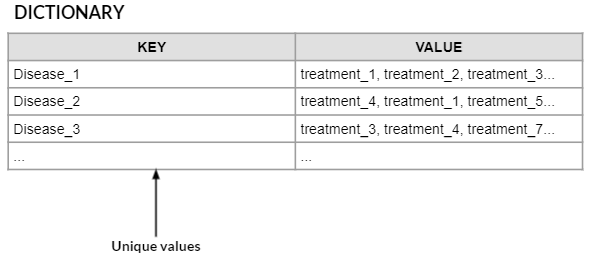

In [52]:
# Creating an empty dictionary to hold diseases and their corresponding treatments
D_T_dict = dict()

for i in range(len(Y_pred)):
    # Get the predicted labels of each test sentence into "val"
    val = Y_pred[i]
    
    # Empty strings to store the values of Diseases and Treatments
    Diseases = ""
    Treatments = ""
    
    # Each loop will iterate through the individual labels and focus on mapping D and T labels
    # with Diseases and Treatments within each sentence into a concatenated string
    for j in range(len(val)):
        if val[j] == 'D': # If label is D, it indicates a Disease 
            Diseases += test_sentences[i].split()[j] + " "
        elif val[j] == 'T': # If label is T, it indicates a Treatment
            Treatments += test_sentences[i].split()[j] + " "
            
    # Removes any extra whitespaces to either end of the string
    Diseases = Diseases.lstrip().rstrip()
    Treatments = Treatments.lstrip().rstrip()

    # If Diseases and Treatments are blank, ignore them
    # If Disease is not present in Dictionary, add it along with the corresponding treatment
    # If Disease is present in the Dictionary, append the treatments for that diseases with existing
    # treatments
    if Diseases != "" and Treatments != "":
        if Diseases in D_T_dict.keys():
            treat_out = list(D_T_dict[Diseases])
            treat_out.append(Treatments)
            D_T_dict[Diseases] = treat_out
        elif Diseases not in D_T_dict.keys():
            D_T_dict[Diseases] = Treatments

<a id="predict_treatment"></a>
### Predict the treatment for the disease name: 'hereditary retinoblastoma'

In [53]:
display(
    D_T_dict['hereditary retinoblastoma']
)

'radiotherapy'

In [54]:
import datetime, pytz; 
print("Current Time in IST:", datetime.datetime.now(pytz.utc).astimezone(pytz.timezone('Asia/Kolkata')).strftime('%Y-%m-%d %H:%M:%S'))

Current Time in IST: 2026-02-26 14:54:02
